# Baseball Data Analysis

Gauri Phatak

Jan 2017

This project analyses part of the baseball data. This dataset includes statistics data for pitching, hitting and fielding. We will be analysing the batting data provided within this dataset.

Here is the short explanation of the meaning of column

2.2 Batting Table

playerID       Player ID code

yearID         Year

stint          player's stint (order of appearances within a season)

teamID         Team

lgID           League

G              Games

AB             At Bats

R              Runs

H              Hits

2B             Doubles

3B             Triples

HR             Homeruns

RBI            Runs Batted In

SB             Stolen Bases

CS             Caught Stealing

BB             Base on Balls

SO             Strikeouts

IBB            Intentional walks

HBP            Hit by pitch

SH             Sacrifice hits

SF             Sacrifice flies

GIDP           Grounded into double plays

## Setup all the required libraries

Loading Pandas, Scipy, and numpy libraries. I will also be using Seaborn for creating visualaisations in this project.

In [412]:
%matplotlib inline

import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import seaborn as sns




Load a csv file into pandas dataframe using read_csv function provided by pandas library
Create a pandas dataframe form the csv file data.
We will exclusively be looking at the batting table for the purpose of this project.

In [413]:
bt = pd.read_csv("Batting.csv")

Check if the data got loaded properly by looking at the sample of the data using dataframe.head function from pandas. 

In [414]:
bt.head()

,playerID,yearID,stint,teamID,lgID,G,AB,R,H,2B,...,RBI,SB,CS,BB,SO,IBB,HBP,SH,SF,GIDP
0,abercda01,1871,1,TRO,NaN,1,4.0,0.0,0.0,0.0,...,0.0,0.0,0.0,0.0,0.0,NaN,NaN,NaN,NaN,NaN
1,addybo01,1871,1,RC1,NaN,25,118.0,30.0,32.0,6.0,...,13.0,8.0,1.0,4.0,0.0,NaN,NaN,NaN,NaN,NaN
2,allisar01,1871,1,CL1,NaN,29,137.0,28.0,40.0,4.0,...,19.0,3.0,1.0,2.0,5.0,NaN,NaN,NaN,NaN,NaN
3,allisdo01,1871,1,WS3,NaN,27,133.0,28.0,44.0,10.0,...,27.0,1.0,1.0,0.0,2.0,NaN,NaN,NaN,NaN,NaN
4,ansonca01,1871,1,RC1,NaN,25,120.0,29.0,39.0,11.0,...,16.0,6.0,2.0,2.0,1.0,NaN,NaN,NaN,NaN,NaN


In [415]:

print bt.columns


Index([u'playerID', u'yearID', u'stint', u'teamID', u'lgID', u'G', u'AB', u'R',
       u'H', u'2B', u'3B', u'HR', u'RBI', u'SB', u'CS', u'BB', u'SO', u'IBB',
       u'HBP', u'SH', u'SF', u'GIDP'],
      dtype='object')


The describe functions gives a summary statistics of all the features of the data.We can see the minimum , maximum values of all the numerical data provided here. We can see that yearID is also included in this description, but year should ideally be a categorical variable. We can fix that later in the project. If we force the describe funciton to print all the included features, it prints information about the categorical variables as well. As we can see in the example below, playerId description is also provided. We can see that playerID unique values are 18659 , which is fewer than the total count of column, we can safely assume that there are multiple entries for different players. This is confirmed with the freq data for that column.
Looking at this description we can see that a lot many columns in this dataframe have NA values. We will handle this in the project further.

In [416]:
bt.describe(include = 'all')

,playerID,yearID,stint,teamID,lgID,G,AB,R,H,2B,...,RBI,SB,CS,BB,SO,IBB,HBP,SH,SF,GIDP
count,101332,101332.000000,101332.000000,101332,100595,101332.000000,96183.000000,96183.000000,96183.000000,96183.000000,...,95759.000000,94883.000000,72729.000000,96183.000000,88345.000000,59620.000000,93373.000000,89845.000000,60151.000000,70075.000000
unique,18659,NaN,NaN,149,6,NaN,NaN,NaN,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
top,mcguide01,NaN,NaN,CHN,NL,NaN,NaN,NaN,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
freq,31,NaN,NaN,4818,51385,NaN,NaN,NaN,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
mean,NaN,1963.506533,1.077567,NaN,NaN,51.400111,149.970327,19.887038,39.261647,6.637067,...,17.965163,3.158184,1.324025,13.811484,21.629849,1.213234,1.113395,2.457900,1.150122,3.210032
std,NaN,38.628278,0.283676,NaN,NaN,47.145273,186.557072,28.671365,53.310941,9.801563,...,26.756514,7.922994,2.838196,21.092775,28.432978,2.894918,2.320660,4.347818,2.023981,4.835881
min,NaN,1871.000000,1.000000,NaN,NaN,0.000000,0.000000,0.000000,0.000000,0.000000,...,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000
25%,NaN,1933.000000,1.000000,NaN,NaN,13.000000,NaN,NaN,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
50%,NaN,1972.000000,1.000000,NaN,NaN,34.000000,NaN,NaN,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
75%,NaN,1997.000000,1.000000,NaN,NaN,80.250000,NaN,NaN,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN


We can get the correlation of the different numerical features with the corr function from pandas. This gives the correlation between all the features in the dataframe. But looking at the numerical information is very difficult. IT would be better if we could map it on a visual plot. We can see how to do that further. By default this function uses pearsons rho for calculating the correlation. 

In [417]:
# We will only take batting into account.
corr = bt.corr(method  = 'pearson')
print corr

          yearID     stint         G        AB         R         H        2B  \
yearID  1.000000  0.002246  0.019478 -0.073102 -0.087965 -0.071422  0.001567   
stint   0.002246  1.000000 -0.120599 -0.099269 -0.093446 -0.094738 -0.090611   
G       0.019478 -0.120599  1.000000  0.946165  0.886558  0.926941  0.875547   
AB     -0.073102 -0.099269  0.946165  1.000000  0.950973  0.987312  0.929086   
R      -0.087965 -0.093446  0.886558  0.950973  1.000000  0.966463  0.917910   
H      -0.071422 -0.094738  0.926941  0.987312  0.966463  1.000000  0.945326   
2B      0.001567 -0.090611  0.875547  0.929086  0.917910  0.945326  1.000000   
3B     -0.247900 -0.066559  0.647558  0.711915  0.742934  0.735753  0.652233   
HR      0.163027 -0.065634  0.664121  0.689583  0.723842  0.698043  0.719772   
RBI    -0.040557 -0.087814  0.867718  0.919150  0.923072  0.934702  0.915200   
SB     -0.147165 -0.057508  0.546593  0.602521  0.657821  0.610866  0.522245   
CS     -0.100832 -0.065501  0.635849  0.

We can use the seaborn heatmap function to better visualize the correlation between different features. We can see some correlation are very strong, like between at bats and number of hits. If we were to continue this dataset further to do predictive analysis, we can use methods like PCA too reduce the redundancy between the data features. Most of the data here looks to be positively correlated. 

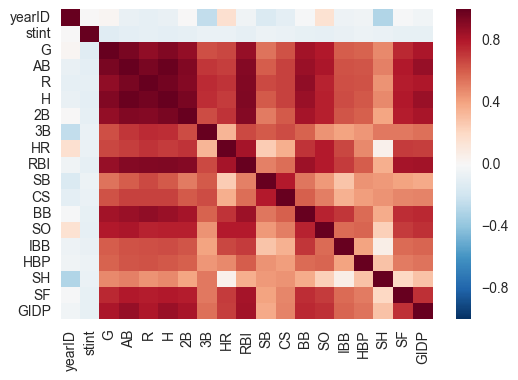

In [418]:

corr = sns.heatmap(corr,xticklabels=corr.columns.values,yticklabels=corr.columns.values)


As we had observed before there were too many NA's in entries in data columns. There are number of ways we can handle this situation. One way is to remove all the row entries which have at leeast one NA value. but we can lose some crucial inforamtion from some columns all together. Another method is, while working on data exploration, we can remove NA values while they are under observation and make a decision after that to delete the NA values or not.

Below we will delete all the NA entries from the dataset and take a look at the correlation heatmap again.

In [419]:
df = bt.dropna()

In [420]:
df.describe(include = 'all')

,playerID,yearID,stint,teamID,lgID,G,AB,R,H,2B,...,RBI,SB,CS,BB,SO,IBB,HBP,SH,SF,GIDP
count,59544,59544.000000,59544.000000,59544,59544,59544.000000,59544.000000,59544.000000,59544.000000,59544.000000,...,59544.000000,59544.000000,59544.000000,59544.000000,59544.000000,59544.000000,59544.000000,59544.000000,59544.000000,59544.000000
unique,10646,NaN,NaN,47,2,NaN,NaN,NaN,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
top,henderi01,NaN,NaN,CHN,NL,NaN,NaN,NaN,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
freq,29,NaN,NaN,2600,32307,NaN,NaN,NaN,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
mean,NaN,1988.744676,1.078497,NaN,NaN,54.290138,140.563751,18.130811,36.390787,6.496658,...,17.075994,2.515031,1.209946,13.491250,24.595358,1.214782,1.064977,1.580781,1.148495,3.156137
std,NaN,18.752368,0.284195,NaN,NaN,47.858501,186.379905,27.293382,52.173745,9.916025,...,26.655506,6.846057,2.608802,21.189941,32.110388,2.896441,2.279511,2.739909,2.020523,4.837343
min,NaN,1890.000000,1.000000,NaN,NaN,0.000000,0.000000,0.000000,0.000000,0.000000,...,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000
25%,NaN,1973.000000,1.000000,NaN,NaN,15.000000,3.000000,0.000000,0.000000,0.000000,...,0.000000,0.000000,0.000000,0.000000,1.000000,0.000000,0.000000,0.000000,0.000000,0.000000
50%,NaN,1992.000000,1.000000,NaN,NaN,37.000000,44.000000,3.000000,7.000000,1.000000,...,3.000000,0.000000,0.000000,2.000000,11.000000,0.000000,0.000000,0.000000,0.000000,1.000000
75%,NaN,2005.000000,1.000000,NaN,NaN,86.000000,229.000000,27.000000,57.000000,10.000000,...,25.000000,2.000000,1.000000,20.000000,37.000000,1.000000,1.000000,2.000000,2.000000,5.000000


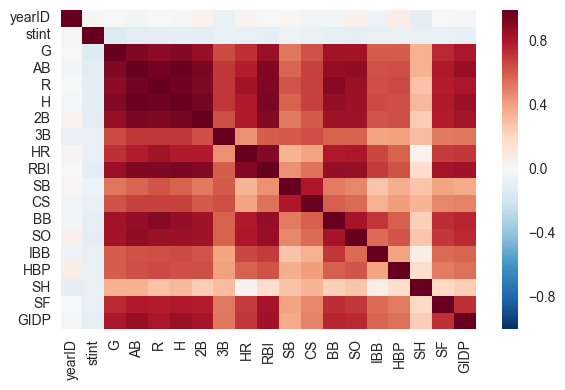

In [421]:
ncorr = df.corr()
sns.heatmap(ncorr,xticklabels=ncorr.columns.values,yticklabels=ncorr.columns.values)
#corr
plt.tight_layout()
plt.show()
#ncorr.get_figure()

We can see above that correlation between the data is maintained even after removing all the rows with NA values. But the size of the dataframe reduces cosiderably, this means we have lost a big chunk of data.

In [422]:
df.dtypes

playerID     object
yearID        int64
stint         int64
teamID       object
lgID         object
G             int64
AB          float64
R           float64
H           float64
2B          float64
3B          float64
HR          float64
RBI         float64
SB          float64
CS          float64
BB          float64
SO          float64
IBB         float64
HBP         float64
SH          float64
SF          float64
GIDP        float64
dtype: object

We can see that the data types of most of the features is float as expected. But datatype for the teamId and leagueId is given as object. We can convert it to category type which will turn it into categorical variable. Same with yearId, It is given as integer number, but it is not very useful as an integer. Hence we will be converting it into a category variable.

In [423]:
df['playerID'] = df['teamID'].astype('category')
df['teamID'] = df['teamID'].astype('category')
df['lgID'] = df['lgID'].astype('category')
df['yearID'] = df['yearID'].astype('category')
print df.dtypes
#df['lgID']

/Users/AknownMouse/anaconda/lib/python2.7/site-packages/ipykernel/__main__.py:1: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: http://pandas.pydata.org/pandas-docs/stable/indexing.html#indexing-view-versus-copy
  if __name__ == '__main__':
/Users/AknownMouse/anaconda/lib/python2.7/site-packages/ipykernel/__main__.py:2: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: http://pandas.pydata.org/pandas-docs/stable/indexing.html#indexing-view-versus-copy
  from ipykernel import kernelapp as app
/Users/AknownMouse/anaconda/lib/python2.7/site-packages/ipykernel/__main__.py:3: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value inste

playerID    category
yearID      category
stint          int64
teamID      category
lgID        category
G              int64
AB           float64
R            float64
H            float64
2B           float64
3B           float64
HR           float64
RBI          float64
SB           float64
CS           float64
BB           float64
SO           float64
IBB          float64
HBP          float64
SH           float64
SF           float64
GIDP         float64
dtype: object


In [424]:
df.describe(include = 'all')

,playerID,yearID,stint,teamID,lgID,G,AB,R,H,2B,...,RBI,SB,CS,BB,SO,IBB,HBP,SH,SF,GIDP
count,59544,59544.0,59544.000000,59544,59544,59544.000000,59544.000000,59544.000000,59544.000000,59544.000000,...,59544.000000,59544.000000,59544.000000,59544.000000,59544.000000,59544.000000,59544.000000,59544.000000,59544.000000,59544.000000
unique,47,113.0,NaN,47,2,NaN,NaN,NaN,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
top,CHN,2015.0,NaN,CHN,NL,NaN,NaN,NaN,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
freq,2600,1486.0,NaN,2600,32307,NaN,NaN,NaN,NaN,NaN,...,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
mean,NaN,NaN,1.078497,NaN,NaN,54.290138,140.563751,18.130811,36.390787,6.496658,...,17.075994,2.515031,1.209946,13.491250,24.595358,1.214782,1.064977,1.580781,1.148495,3.156137
std,NaN,NaN,0.284195,NaN,NaN,47.858501,186.379905,27.293382,52.173745,9.916025,...,26.655506,6.846057,2.608802,21.189941,32.110388,2.896441,2.279511,2.739909,2.020523,4.837343
min,NaN,NaN,1.000000,NaN,NaN,0.000000,0.000000,0.000000,0.000000,0.000000,...,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000
25%,NaN,NaN,1.000000,NaN,NaN,15.000000,3.000000,0.000000,0.000000,0.000000,...,0.000000,0.000000,0.000000,0.000000,1.000000,0.000000,0.000000,0.000000,0.000000,0.000000
50%,NaN,NaN,1.000000,NaN,NaN,37.000000,44.000000,3.000000,7.000000,1.000000,...,3.000000,0.000000,0.000000,2.000000,11.000000,0.000000,0.000000,0.000000,0.000000,1.000000
75%,NaN,NaN,1.000000,NaN,NaN,86.000000,229.000000,27.000000,57.000000,10.000000,...,25.000000,2.000000,1.000000,20.000000,37.000000,1.000000,1.000000,2.000000,2.000000,5.000000


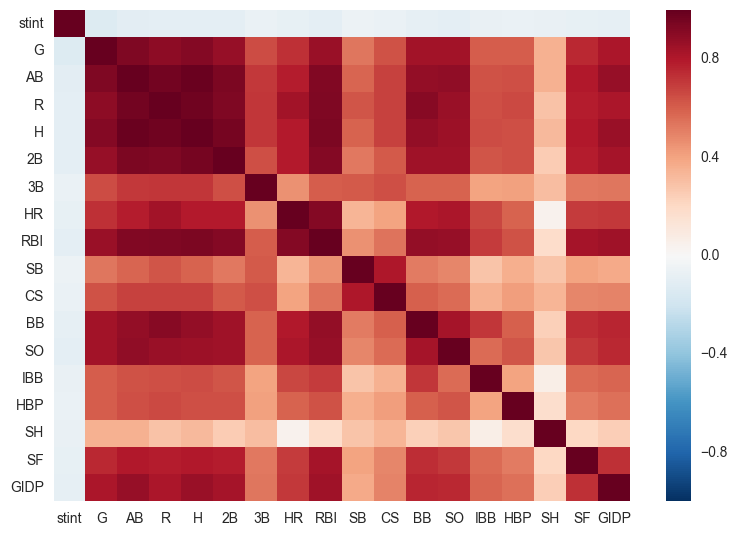

In [425]:
ncorr = df.corr()
sns.set()
sns.heatmap(ncorr,xticklabels=ncorr.columns.values,yticklabels=ncorr.columns.values)
#corr
plt.tight_layout()
plt.show()

We can use pairplot to get a visual idea about the relationship between the data entries for all features. Based on the plot shown below we can see that all the data in this dataset is highly correlted, this confirms the heatmap that we saw earlier. We can also wee that the data is left skewed at many places. We can use the preprocessing functionality from sklearn library to normalize the data, but here we will be using apply function and apply normalization over all the columns of the dataframe.

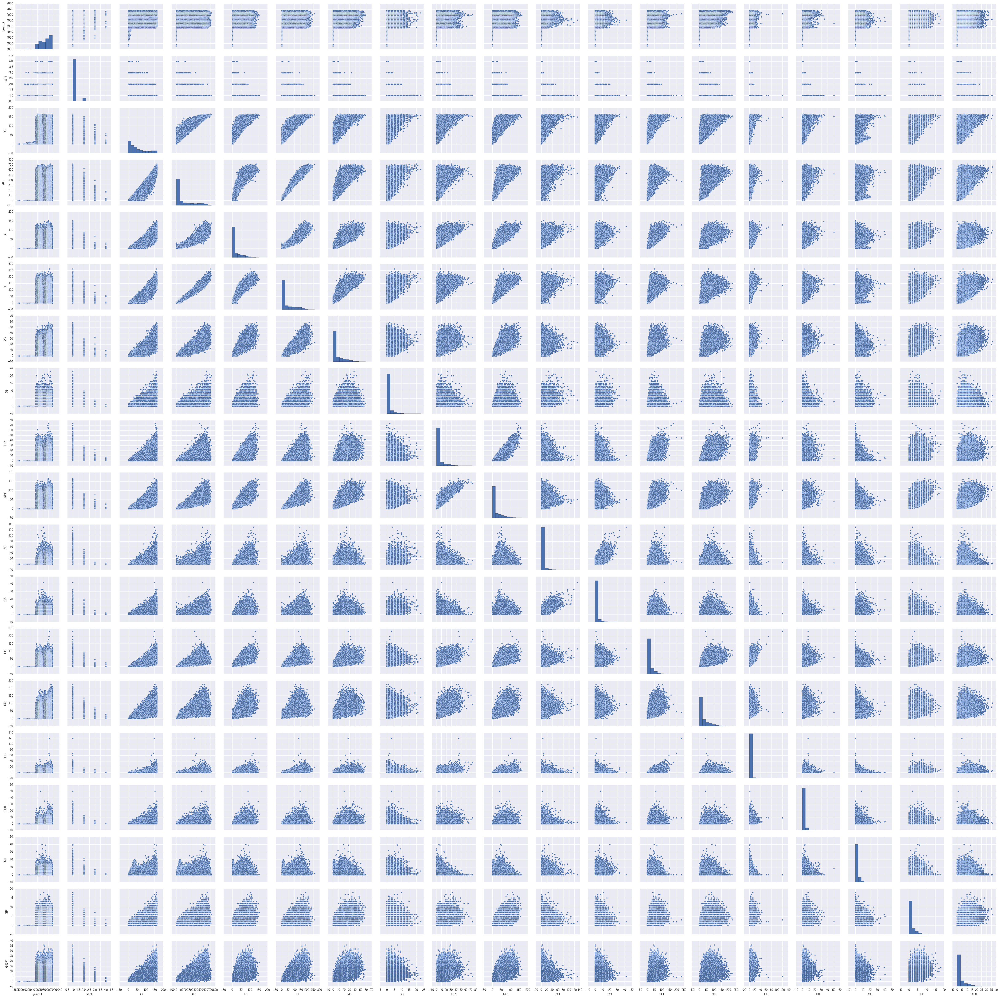

In [426]:
sns.pairplot(df)

We can try and normalize data, which will be better to use when we are running our analytics solutions. Since normalization needs either numerical data, we will have to drop categorical data. As we can see the data a bit more normlaized.

In [427]:
df_normalized = df.drop(['playerID','yearID','teamID','lgID'], axis =1)

df_normalized = df_normalized.apply(lambda x: (x - np.mean(x)) / (np.max(x) - np.min(x)))
df_normalized['playerID'] = df['playerID']
df_normalized['yearID'] = df['yearID']
df_normalized['teamID'] = df['teamID']
df_normalized['lgID'] = df['lgID']

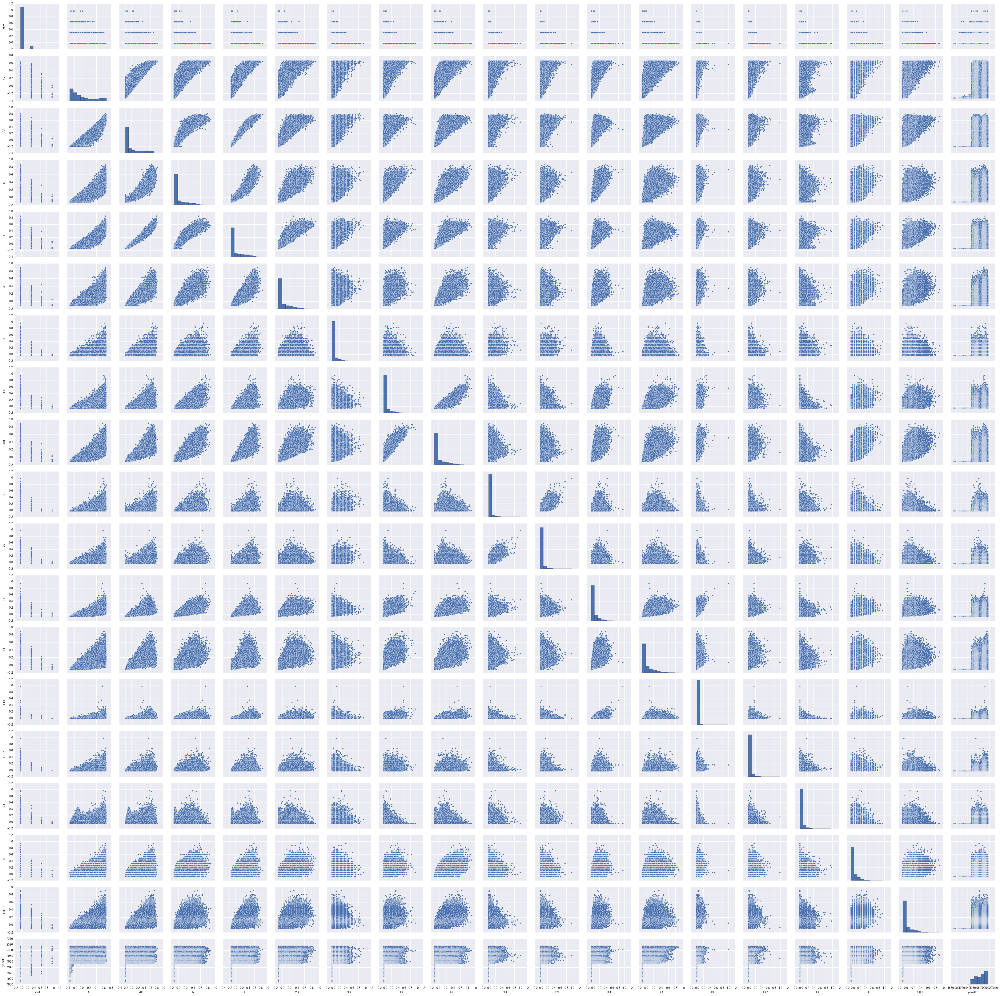

In [428]:
sns.pairplot(df_normalized)

In [429]:
df_normalized.head()

,stint,G,AB,R,H,2B,3B,HR,RBI,SB,...,SO,IBB,HBP,SH,SF,GIDP,playerID,yearID,teamID,lgID
4560,-0.026166,-0.322971,-0.196318,-0.119282,-0.138896,-0.110113,-0.038413,-0.050893,-0.103491,-0.019346,...,-0.110293,-0.010123,-0.0213,-0.03952,-0.063805,-0.08767,PHI,1890,PHI,NL
5088,-0.026166,-0.322971,-0.196318,-0.119282,-0.138896,-0.110113,-0.038413,-0.050893,-0.103491,-0.019346,...,-0.110293,-0.010123,-0.0213,-0.03952,-0.063805,-0.08767,BSN,1891,BSN,NL
5177,-0.026166,-0.322971,-0.196318,-0.119282,-0.138896,-0.110113,-0.038413,-0.050893,-0.103491,-0.019346,...,-0.110293,-0.010123,-0.0213,-0.03952,-0.063805,-0.08767,NY1,1891,NY1,NL
5415,-0.026166,-0.322971,-0.196318,-0.119282,-0.138896,-0.110113,-0.038413,-0.050893,-0.103491,-0.019346,...,-0.110293,-0.010123,-0.0213,-0.03952,-0.063805,-0.08767,BSN,1891,BSN,NL
5747,-0.026166,-0.322971,-0.196318,-0.119282,-0.138896,-0.110113,-0.038413,-0.050893,-0.103491,-0.019346,...,-0.110293,-0.010123,-0.0213,-0.03952,-0.063805,-0.08767,CL4,1892,CL4,NL


## Questions to be asked with this data for visualization
Since we have seen the chart of all the correlations and pairplot distribution, we can take a look at the data in a multivariate platform. 

### Compare the Homeruns the player made related to the runs made during their career according to the data.

We can use joint plot form seaborn to understand the relationship between the homeruns made by the player 
and the runs for that entry. The joint plot function gives us the distribution of the variables and the fits a linear model for the two variables. As we can see from the plot below, regular linear model might not explain the spread of the data. 


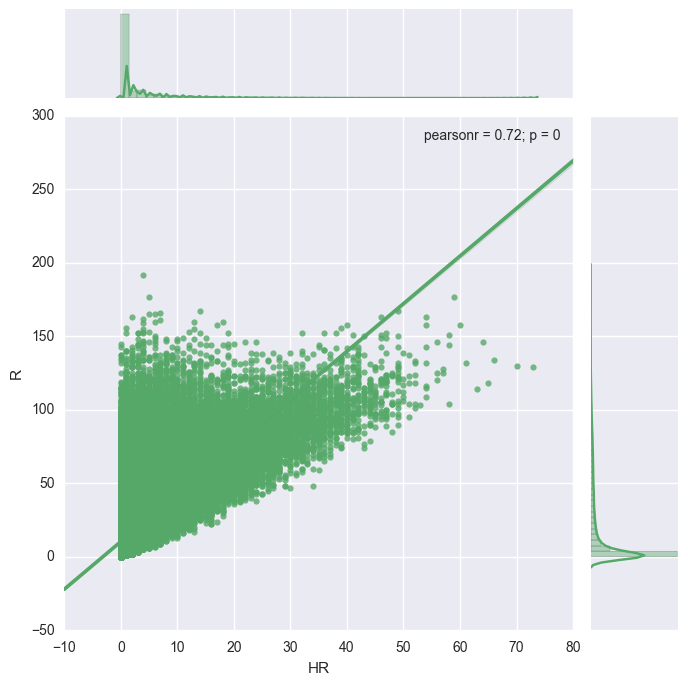

In [430]:
sns.set(style="darkgrid", color_codes=True)
sns.jointplot(x = 'HR', y='R', data = bt, kind="reg",color="g", size=7, dropna = True)

### Games played per leagues over the years.

In the plot below we can see the stripplot of the games played per league over the year. what is interesting with this plot is. a lot of data for different leagues would have been lost if we considered the filtered dataframe with no NA values. We can see that in the 2nd plots shown below. Hence, we have to be careful while filtering data , we might endup losing crucial information about a lot many features.

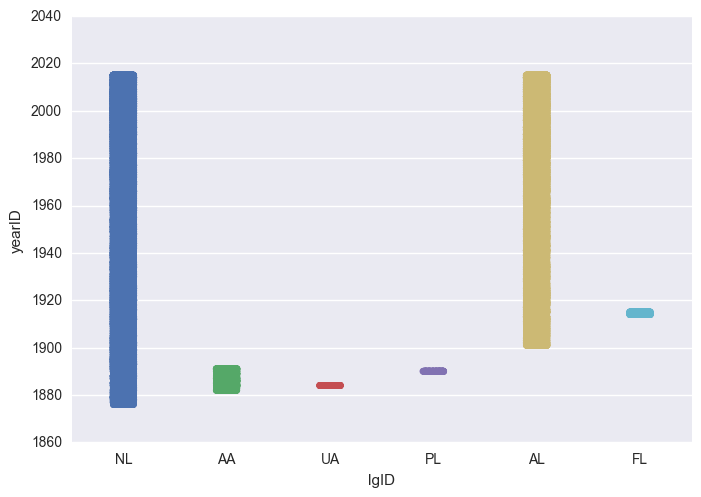

In [431]:
sns.stripplot(x = 'lgID', y= 'yearID', data = bt, jitter = True)

/Users/AknownMouse/anaconda/lib/python2.7/site-packages/ipykernel/__main__.py:1: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: http://pandas.pydata.org/pandas-docs/stable/indexing.html#indexing-view-versus-copy
  if __name__ == '__main__':


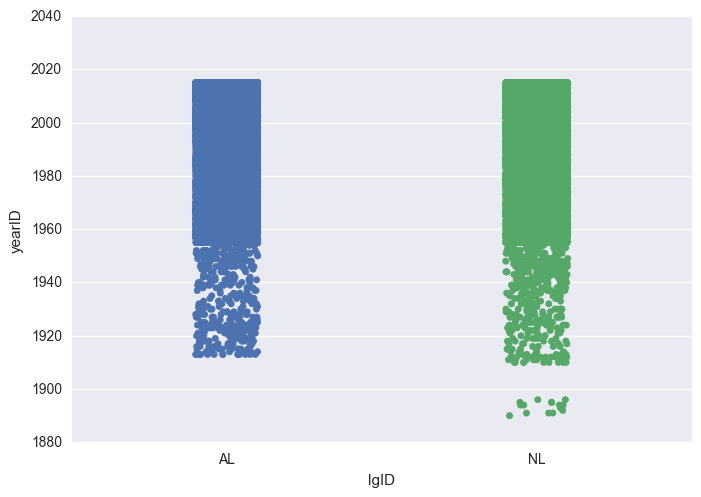

In [432]:
df['yearID'] = df['yearID'].astype('int64')
sns.stripplot(x = 'lgID', y= 'yearID', data = df, jitter = True)

In [433]:
df['yearID'] = df['yearID'].astype('category')

/Users/AknownMouse/anaconda/lib/python2.7/site-packages/ipykernel/__main__.py:1: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: http://pandas.pydata.org/pandas-docs/stable/indexing.html#indexing-view-versus-copy
  if __name__ == '__main__':


### Multivariate plot to understand the number of hits over the year color coded based on team.

We can see the number of hits over year for the different leagues . Here we have used unfiltered data again, since we would have lost leagues information using filtered data. It might also be the case that some of the leagues were older and dissolved, since there is no data on them for last couple of decades. 

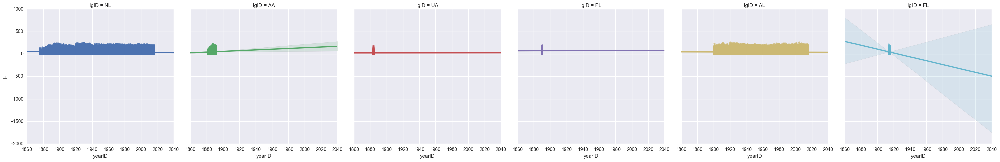

In [434]:
sns.lmplot(x = 'yearID', y = 'H', data = bt, col = 'lgID', hue = 'lgID')

### Runs vs Homeruns color coded over the teamID

We can see if there is a relationship between the homerun number and the total number of runs. We can see that there is a fairly linear relationship between the two variables. We are plotting this values using the normalized data. Since the data variation amount the entries in a column is not very high the distribution remains almost the same.

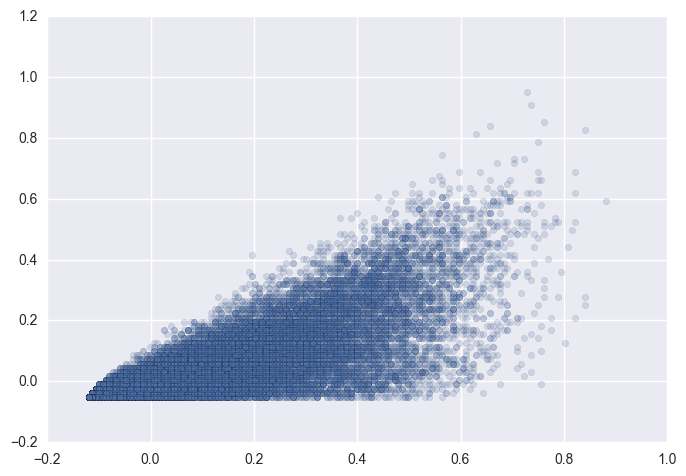

In [435]:
plt.scatter(df_normalized['R'], df_normalized['HR'], alpha = 0.2)

### find out the homesruns grouped over the playerIDs and fine the mean value of all the numerical features. 

In [436]:
grouped = bt.groupby(['playerID']).mean()
grouped.describe(include = 'all')

,yearID,stint,G,AB,R,H,2B,3B,HR,RBI,SB,CS,BB,SO,IBB,HBP,SH,SF,GIDP
count,18659.000000,18659.000000,18659.000000,18232.000000,18232.000000,18232.000000,18232.000000,18232.000000,18232.000000,18100.000000,18106.000000,13760.000000,18232.000000,16713.000000,10719.000000,17603.000000,16666.000000,10784.000000,12517.000000
mean,1957.191166,1.048965,33.143506,86.733333,10.946829,21.774976,3.589743,0.778249,1.420429,9.596994,1.768006,0.850647,7.497493,13.326683,0.583833,0.668337,1.578791,0.607496,1.865539
std,41.835709,0.102792,32.464936,121.344326,17.559852,33.484379,5.939626,1.538175,3.510592,16.051084,4.527998,1.921506,12.720425,18.748655,1.426438,1.373371,2.651195,1.111116,2.995328
min,1871.000000,1.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000,0.000000
25%,1920.000000,1.000000,8.000000,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
50%,1962.500000,1.000000,22.285714,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
75%,1996.200000,1.062500,47.000000,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN
max,2015.000000,2.428571,153.428571,603.666667,120.714286,192.000000,40.545455,16.263158,37.333333,118.230769,65.142857,26.000000,116.272727,199.000000,31.272727,18.692308,37.111111,8.666667,21.555556


### Is there a pattern between the mean value for Homeruns over the years for all the players? 

From the plot below we can see that the number of mean homeruns for players has steadily increased over the years. This can be attributed to better playing stratergies, better equipment or number of other factors support players in the modern times.

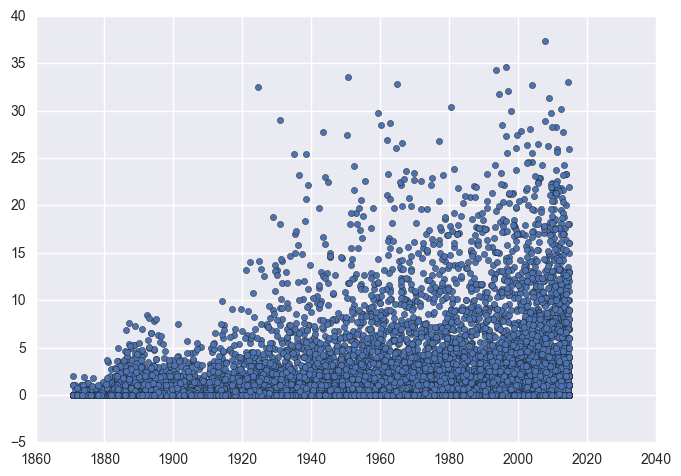

In [437]:
plt.scatter(grouped['yearID'],grouped['HR'])

### Can we take a look at relationship between the different values of data grouped over the year? This can give us a better understanding of changes over the year for the game over all.

In the plot below we can see the trend for diffrent features over each decade starting from 1871 till 2015. We are using the original loaded data her so as not to miss out on rows with individual NA values. The mean value in the last decade seems to be reducing because we are not including the entire decade for consideration there. We can add more features to this plot to understand the relationship between the different variables if needed.

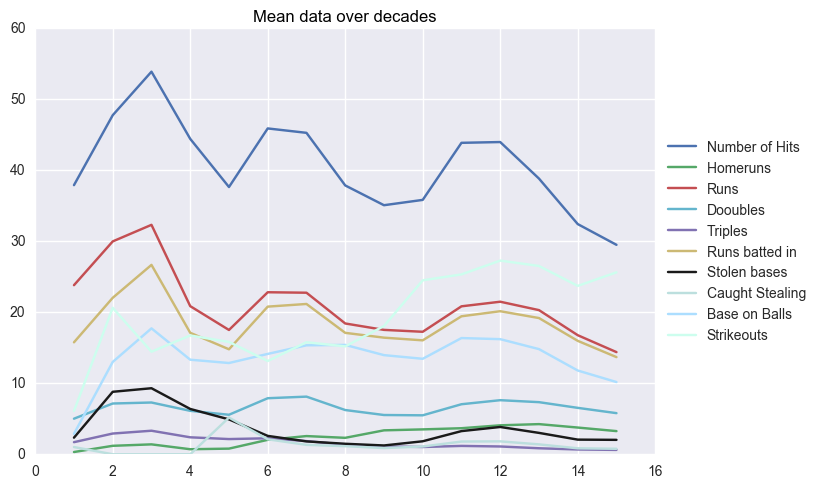

In [438]:

bt['teamID'] = bt['teamID'].astype('category')
bt['lgID'] = bt['lgID'].astype('category')
bt['yearID'] = bt['yearID'].astype('category')

nbt =bt.sort_values('yearID')
bins =  np.arange(1871,2015,10)
ind = np.digitize(bt['yearID'],bins)

nbt = nbt.groupby(ind).mean()
plt.title('Mean data over decades', color='black')
plt.plot(nbt['H'], label = 'Number of Hits ', color = 'b')
plt.plot(nbt['HR'], label = 'Homeruns ', color = 'g')
plt.plot(nbt['R'], label = 'Runs', color = 'r')
plt.plot(nbt['2B'], label = 'Dooubles', color = 'c')
plt.plot(nbt['3B'], label = 'Triples', color = 'm')
plt.plot(nbt['RBI'], label = 'Runs batted in ', color = 'y')
plt.plot(nbt['SB'], label = 'Stolen bases', color = 'k')
plt.plot(nbt['CS'], label = 'Caught Stealing', color = '#bcdfde')
plt.plot(nbt['BB'], label = 'Base on Balls', color = '#acdeff')
plt.plot(nbt['SO'], label = 'Strikeouts', color = '#cdfeee')
#plt.plot(nbt[''], label = '')

plt.legend(loc='center left', bbox_to_anchor=(1.0, 0.5))
plt.show()


### Is there a relation between the number of strikeout over the years?

We can see below, that number of strikeouts were infact very low till about 1955, then there is a sudden increase in the value there. I got curious about this phenomenon, and not knowning much about the game searched online for some information about changes in the game in mid 50's . And it looks like there was a major change as stated here https://en.wikipedia.org/wiki/Major_League_Baseball_relocation_of_1950s%E2%80%9360s between 50 and 60. This phenomenon is not just observed with strikeouts, we can see this with this features as well. as seen in the 2nd plot. 


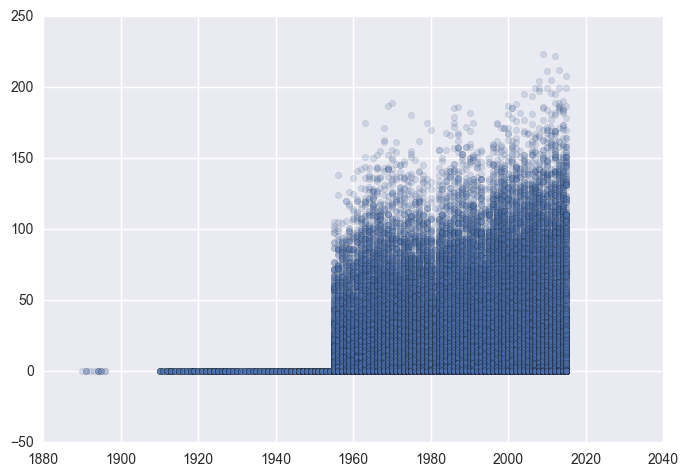

In [439]:
plt.scatter(y = df['SO'], x = df['yearID'], alpha = 0.2)

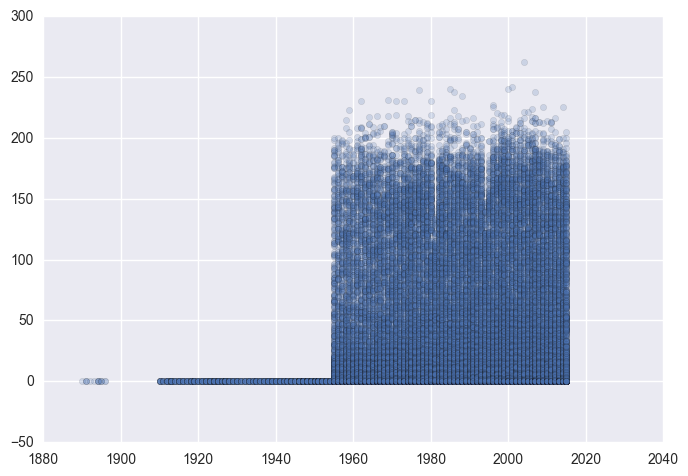

In [440]:
plt.scatter(y = df['H'], x = df['yearID'], alpha = 0.2)


## Conclusion

This is a very big data set with multiple files. If we move to possibily predicting the outcome of a game using this data. We can do so combining multiple files. We might even be able to predict performance of a player for the seasonusing this dataset. One this to note however is. given the last plots that we saw, it might not be useful to include data from before 1955 to predict outcome of modern games. but that woudl be a speculation which can only have a conclusive answer after we run some analytics on the given dataset.

## References

http://pandas.pydata.org/

https://www.scipy.org/

http://stackoverflow.com/questions/16947336/binning-a-dataframe-in-pandas-in-python

